(f_rs_plot)=


---------------
```{admonition} Learning Objectives
  - Visualize RGB images from remotely sensed data
  - Visualize true-color and false-color composites
  - View path and row of swaths
```
```{admonition} Review
* [Data Structures](c_features.md)
* [Raster Data ](c_rasters.md)
* [Opening Remotely Sensed Data](f_rs_io.md)
```
--------------


# Plot Remote Sensed Images
Import required modules and data.

In [1]:
import os
import rioxarray as rxr
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe

## Plot a Single Band Image

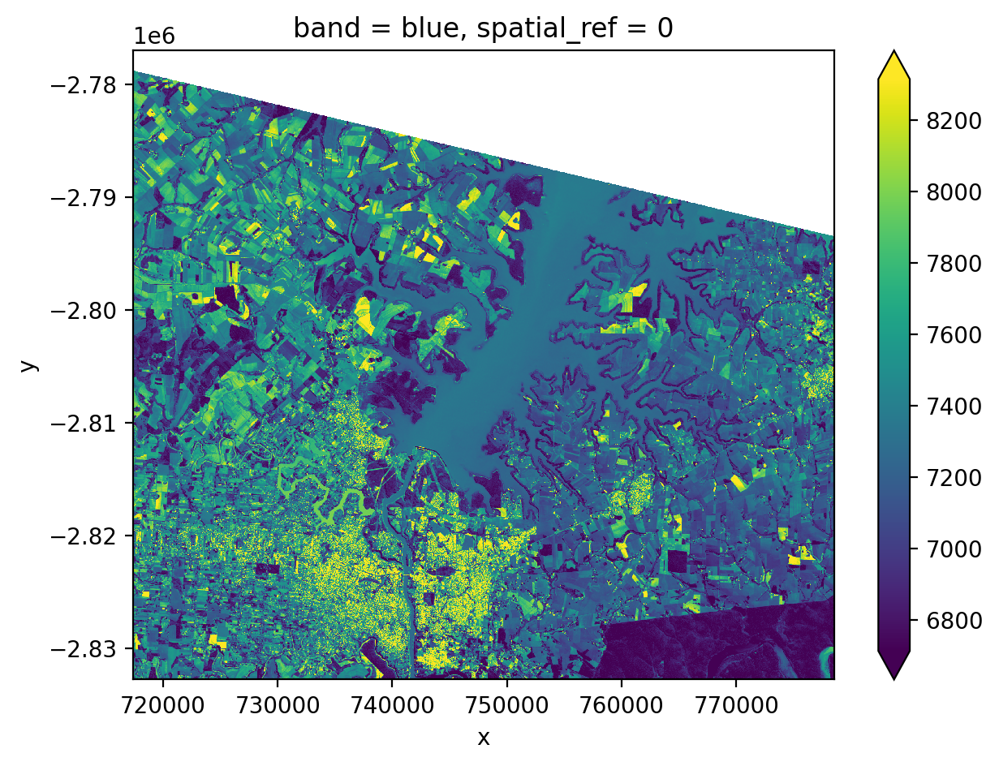

In [2]:
image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

fig, ax = plt.subplots(dpi=200)
src = rxr.open_rasterio(image_path).isel(band=1).assign_coords(band='blue')
src.where(src != 0).plot.imshow(robust=True, ax=ax)
plt.tight_layout(pad=1)

## Plot a True Color LandSat Image
Here we open the image, missing data is removed with `.where(src != 0)`, remember the bands in this file are stored in reverse order (blue, green, red), so we put them back into order `.sel(band=[3, 2, 1])`.

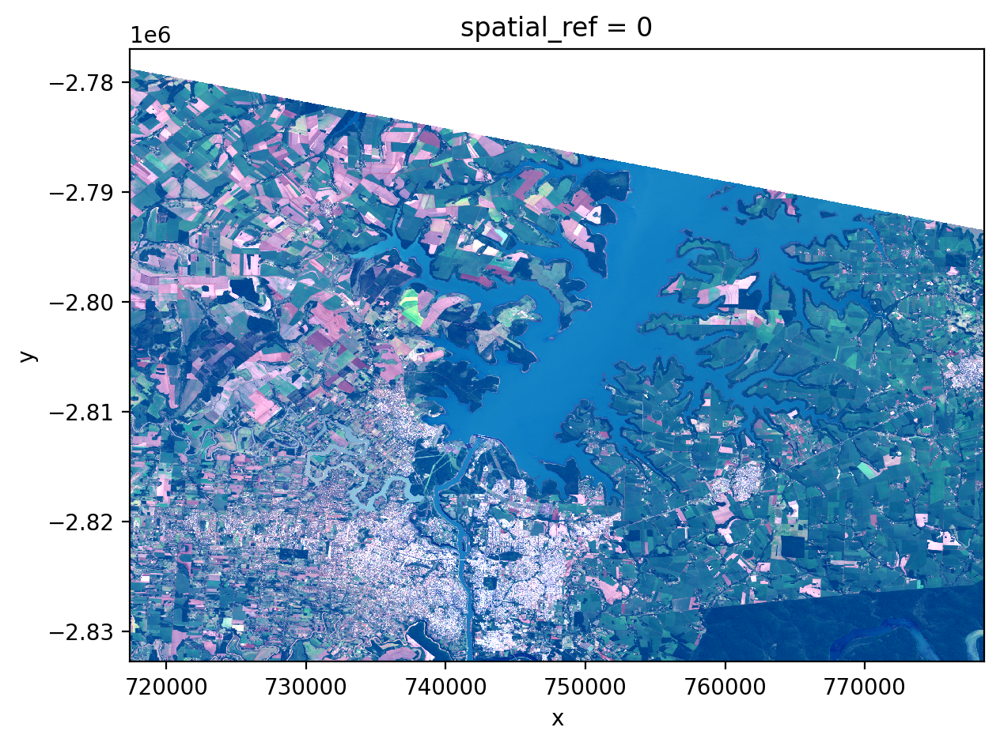

In [3]:
image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

fig, ax = plt.subplots(dpi=200)
src = rxr.open_rasterio(image_path)
src.where(src != 0).isel(band=[2, 1, 0]).plot.imshow(robust=True, ax=ax)
plt.tight_layout(pad=1)

Note you can also set the missing data value when opening a file (assuming it is not in the raster profile), those values then need to be masked using `gw.mask_nodata()` and `src` updated:

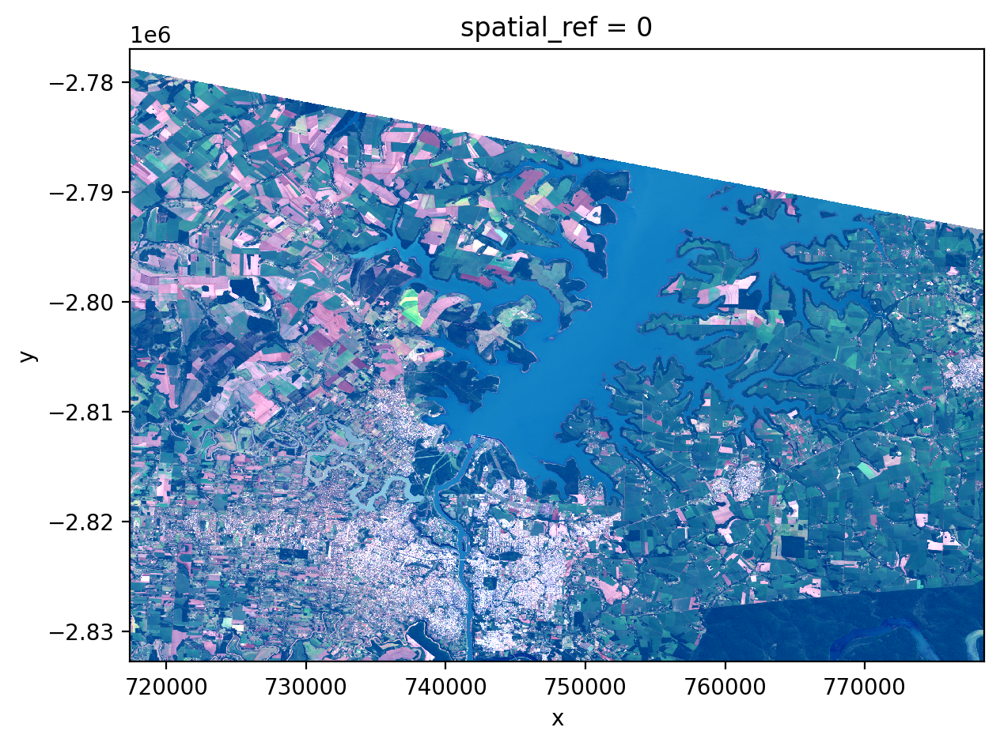

In [4]:
import numpy as np

image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

fig, ax = plt.subplots(dpi=200)
src = rxr.open_rasterio(image_path).rio.write_nodata(0)
# Replace 0 with nan
src = src.where(src != 0, np.nan)
src.isel(band=[2, 1, 0]).plot.imshow(robust=True, ax=ax)
plt.tight_layout(pad=1)

## Plot False Color Composites 
We can use the red, green, and blue channels to show different parts of the spectrum. This allows us for instance to "see" near-infrared (nir). Moreover certain combinations of bands allow us to better identify vegetation, urban environments, water, etc. There are many false colored composites that can be used to highlight different features. 

<iframe width="560" height="315" src="https://www.youtube.com/embed/YP0et8l_bvY" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

### Color Infrared (vegetation)
Here we will look at a common false color combo to assigns the nir band to the color red. This make vegetation appear bright red.

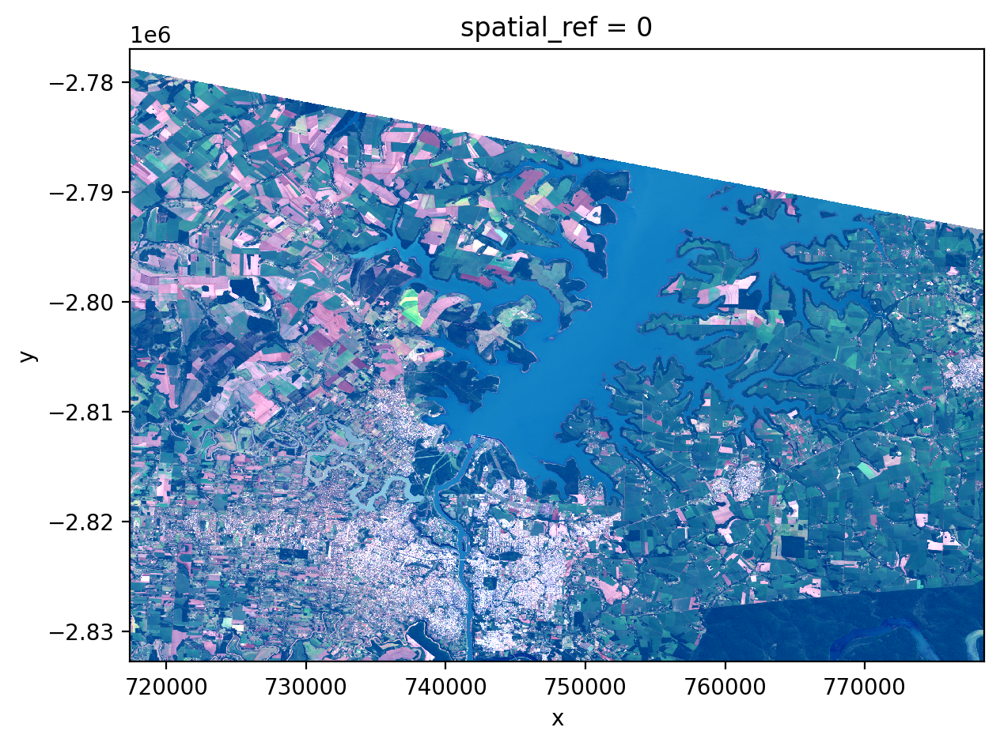

In [5]:
image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

fig, ax = plt.subplots(dpi=200)
# Assuming bands are ordered and NIR is band 4 (index 3)
src = rxr.open_rasterio(image_path)
if len(src.band) >= 4:
    src = src.assign_coords(band=['blue', 'green', 'red', 'nir'][:len(src.band)])
    src.where(src != 0).isel(band=[3, 2, 1]).plot.imshow(robust=True, ax=ax)
else:
    # Fallback if not enough bands
    src.where(src != 0).isel(band=[2, 1, 0]).plot.imshow(robust=True, ax=ax)
plt.tight_layout(pad=1)
plt.savefig("rgb_plot.png", dpi=150)

### Common Band Combinations for Landsat 8

| Name    | Band Combination    |
| :--- | ---: |
| Natural Color    | 4 3 2  |
| False Color (urban) |  7 6 4|
| Color Infrared (vegetation) |	5 4 3|
| Agriculture |	6 5 2|
| Atmospheric Penetration |	7 6 5|
| Healthy Vegetation |	5 6 2 |
| Land/Water |	5 6 4|
| Natural With Atmospheric Removal |	7 5 3 |
|Shortwave Infrared |	7 5 4|
|Vegetation Analysis| 	6 5 4|

<!-- 
## Plot Union of two LandSat Images
As an example let's plot the union with `mosaic=True` of two images taken on the same day, but blue band only. Note we rename the band name with `band_names=['blue']`.

```{code-cell} ipython3
# from geowombat.data import l8_224077_20200518_B2, l8_224078_20200518_B2

# fig, ax = plt.subplots(dpi=200)
# filenames = [l8_224077_20200518_B2, l8_224078_20200518_B2]
# with gw.open(filenames,
#                 band_names=['blue'],
#                 mosaic=True,
#                 bounds_by='union') as src:
#     src.where(src != 0).sel(band='blue').plot.imshow(robust=True, ax=ax)
# plt.tight_layout(pad=1)
```

## Plot Intersection of two LandSat Images
Same idea with the intersection, using `bounds_by='intersection'`, we still need to mosaic the two images `mosaic=True`.

```{code-cell} ipython3
# fig, ax = plt.subplots(dpi=200)
# filenames = [l8_224077_20200518_B2, l8_224078_20200518_B2]
# with gw.open(filenames,
#                 band_names=['blue'],
#                 mosaic=True,
#                 bounds_by='intersection') as src:
#     src.where(src != 0).sel(band='blue').plot.imshow(robust=True, ax=ax)
# plt.tight_layout(pad=1)
```
 -->

## Plot LandSat Tile Footprints
Here we set up a more complicated plotting function for near IR 'nir'.  Note the use of `footprint_grid`.

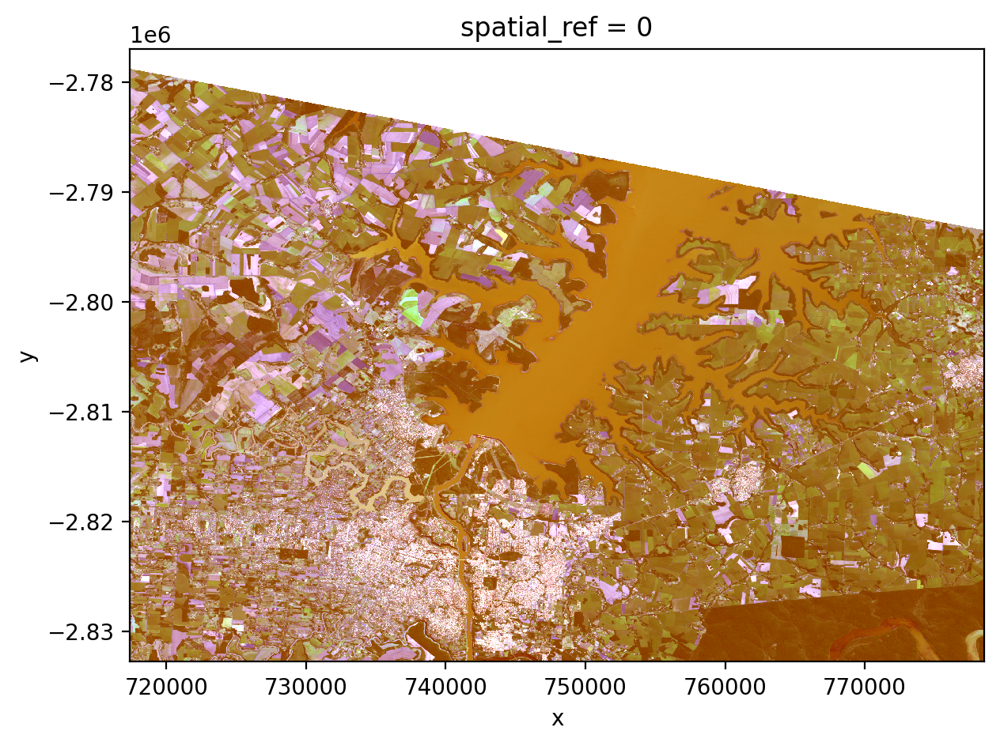

In [10]:
# For examples requiring NIR, use one of the existing bands as a substitute
image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"

fig, ax = plt.subplots(dpi=200)
src = rxr.open_rasterio(image_path)

# Assign meaningful names to your 3 bands
src = src.assign_coords(band=['red', 'green', 'blue'])  # or whatever they actually represent

# For "NIR" examples, use the red band as a substitute
src.where(src != 0).sel(band=['red', 'green', 'blue']).plot.imshow(robust=True, ax=ax)
plt.tight_layout(pad=1)

The two plots below illustrate how two images can be mosaicked. The orange grids highlight the image footprints while the black grids illustrate the ``DataArray`` chunks.

In [9]:
import rioxarray as rxr

image_path = "../../pygis/data/LC08_L1TP_224078_20200518_20200518_01_RT.TIF"
src = rxr.open_rasterio(image_path)
print("RioXarray data shape:", src.shape)
print("RioXarray bands:", src.band.values)
print("Number of bands:", len(src.band))
print("Data info:")
print(src)

RioXarray data shape: (3, 1860, 2041)
RioXarray bands: [1 2 3]
Number of bands: 3
Data info:
<xarray.DataArray (band: 3, y: 1860, x: 2041)> Size: 23MB
[11388780 values with dtype=uint16]
Coordinates:
  * band         (band) int64 24B 1 2 3
  * x            (x) float64 16kB 7.174e+05 7.174e+05 ... 7.785e+05 7.786e+05
  * y            (y) float64 15kB -2.777e+06 -2.777e+06 ... -2.833e+06
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
